# **Praca domowa 7**
### Bartłomiej Eljasiak
## **Opis**
W poniższym dokumencie podejmę się kompresji wymiarów zdjęcia używając do tego PCA.

## **Biblioteki użyte**

In [2]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

import pandas as pd
from sklearn.decomposition import PCA, IncrementalPCA
import numpy as np

### **Załadowanie oryginalnego obrazu**

In [3]:
img_raw = mpimg.imread('oryginal.png')
img = img_raw.copy()

![](oryginal.png)

## **Funkcje pomocnicze**

In [19]:
import warnings
warnings.filterwarnings('ignore')

def image_compression(img, components_nr):
    # should work both for rgb and rgba images
    ipca = IncrementalPCA(n_components=components_nr)
    transformed_size = 0
    compressed_img = np.empty(shape = img.shape)
    for i,_ in enumerate(img[0,0]):
        transformed = ipca.fit_transform(img[:,:,i])
        transformed_size+=transformed.size
        compressed_img[:,:,i] = (ipca.inverse_transform(transformed))
    # return compressed image
    return compressed_img, transformed_size



def find_components_for_variance(img, varaiance = 0.95):
    pca = PCA()
    for i,_ in enumerate(img[0,0]):
        pca.fit(img[:,:,i])
        # Getting the cumulative variance

        var_cumu = np.cumsum(pca.explained_variance_ratio_)
        k = np.argmax(var_cumu>varaiance)
        print(f"Ilość cech wyjaśniających {round(varaiance,2)*100}% wariancji w warstwie {i+1}: "+ str(k))
        
def test_components_nr(img, components_nr):
    compressed_img,compressed_size = image_compression(img, components_nr)
    size_reduction = 1 - compressed_size/img.size
    plt.figure(figsize=[28,14])
    plt.title(f"{components_nr} komponentów | Redukcja rozmiaru zdjecia na poziomie {round(size_reduction*100,2)}%")
    plt.imshow(compressed_img)
    del compressed_img

## **Informacje o zdjęciu**

In [5]:
img.shape

(1532, 2043, 4)

Jest to zdjęcie o rozmiarze (1532,2043) i 4 warstwach koloru, inaczej mówiąc całkiem dużego zrozmiaru zdjęcie RGBA.
Każdą z tych macierzy koloru będe chciał przetransformować używając PCA. Zdecydowałem sie przekształacać wszystkie warstywy używająć tyle samo cech, jednakże przy delikanej zmienie kodu możnaby to każdą warstę skalować przy użyciu optymalnej liczby cech. Ale właśnie, jak ją wyznaczyć? 

### **Znajdowanie ilości cech**
By znaleźc odpowiednią ilość cech musimy najpierw stwierdzić jaki chcemy mieć próg wytłumaczalnej warancji.  
Dobre wyniki daje już próg 95%, więc tego spróbujemy najpierw.

In [20]:
explained_variance_ratio = 0.95

In [21]:
find_components_for_variance(img, explained_variance_ratio)

Ilość cech wyjaśniających 95.0% wariancji w warstwie 1: 124
Ilość cech wyjaśniających 95.0% wariancji w warstwie 2: 121
Ilość cech wyjaśniających 95.0% wariancji w warstwie 3: 121
Ilość cech wyjaśniających 95.0% wariancji w warstwie 4: 0


Jednakże jeżeli chcemy obraz o lepszej jakości, powinniśmy zwiększyć nasz próg do wartości 99%. Sprawdźmy ile wtedy potrzebujemy cech.

In [22]:
explained_variance_ratio = 0.99

In [23]:
find_components_for_variance(img, explained_variance_ratio)

Ilość cech wyjaśniających 99.0% wariancji w warstwie 1: 376
Ilość cech wyjaśniających 99.0% wariancji w warstwie 2: 375
Ilość cech wyjaśniających 99.0% wariancji w warstwie 3: 377
Ilość cech wyjaśniających 99.0% wariancji w warstwie 4: 0


Co ciekawe ilość potrzebych cech do wyjaśnienia wariancji w każdej z warstw jest zbliżona. W toerii tak powinno być w większosci przypadków, jednakże na pewno istnieją takie obrazy, gdzie liczby cech będą zupełnie różne. Jednakże to temat na inny moment. 

**Jak widzimy teoretycznie drobna zmiana w jakości wymaga już dużo większej ilości cech.**

## **Testy kompresji**
Poniżej przechodzę po całym przedziale możliwych ilości cech/komponentów. Warto spojrzeć na to, że do ostatniego momentu poziom redukcji rozmiaru zdjęcia zostaje bardzo wysoki.
Niestety iteracja po pętli powodowała problemy z pamięcią, tak wszystkie komórki wywołane są oddzielnie.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


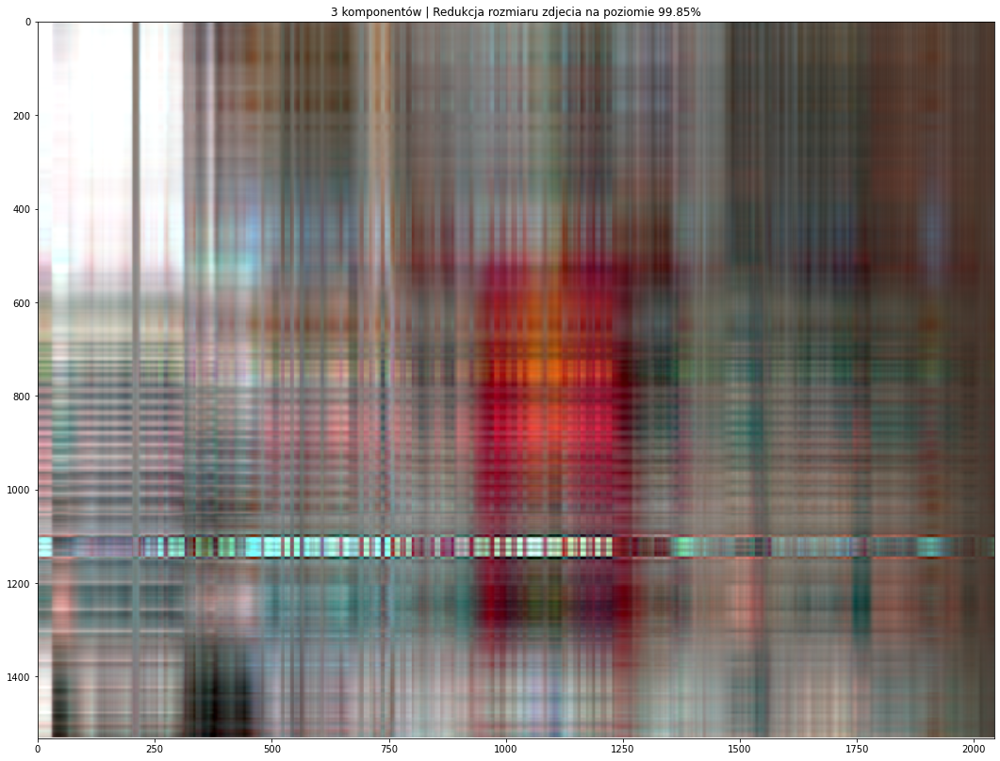

In [8]:
test_components_nr(img,3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


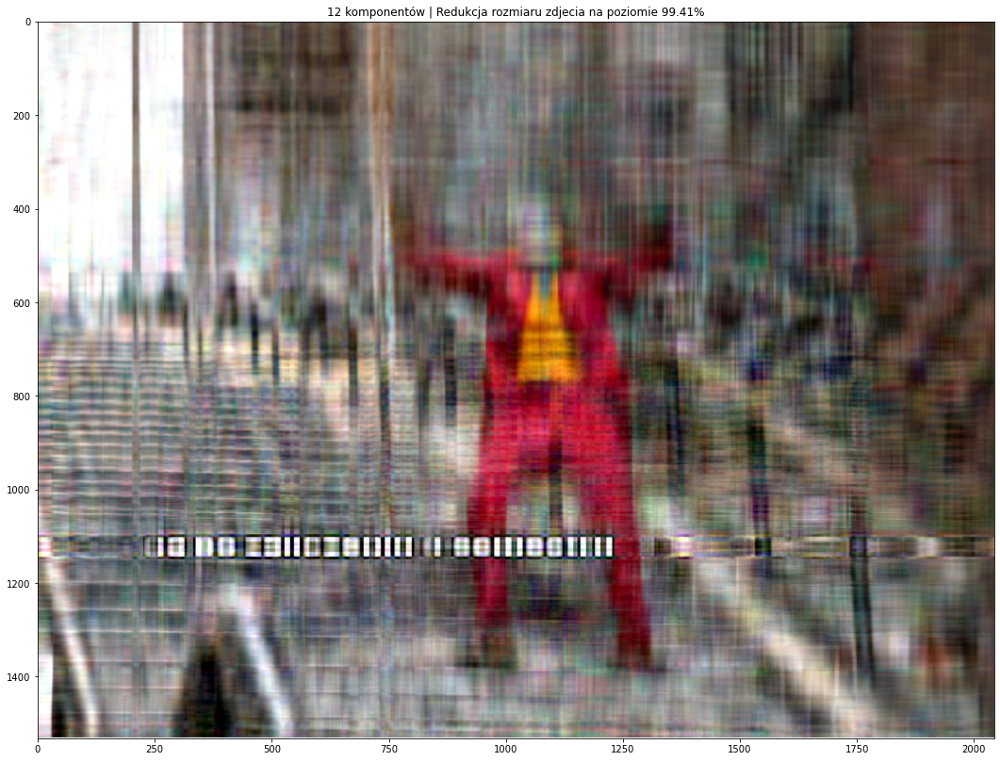

In [9]:
test_components_nr(img,12)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


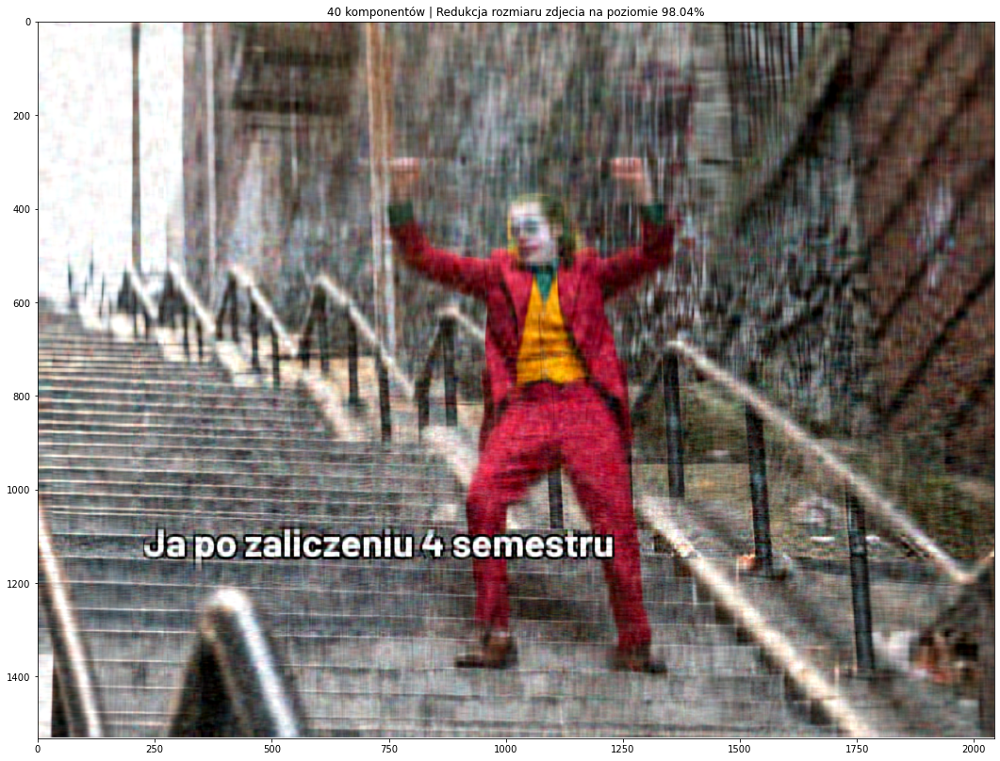

In [10]:
test_components_nr(img,40)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


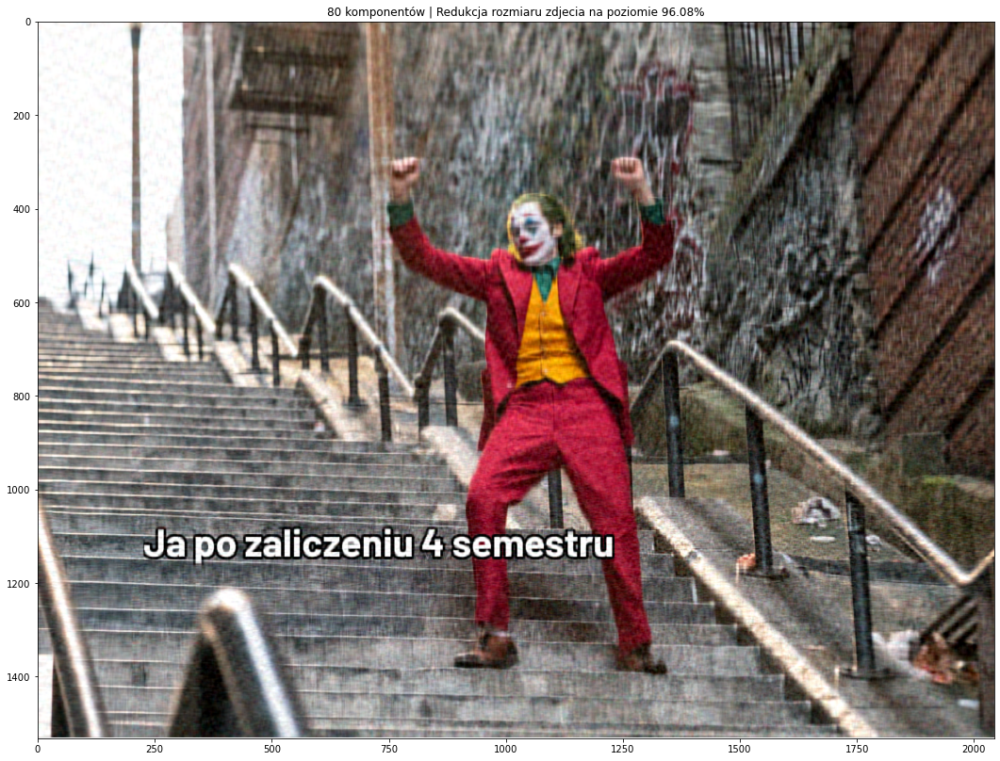

In [11]:
test_components_nr(img,80)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


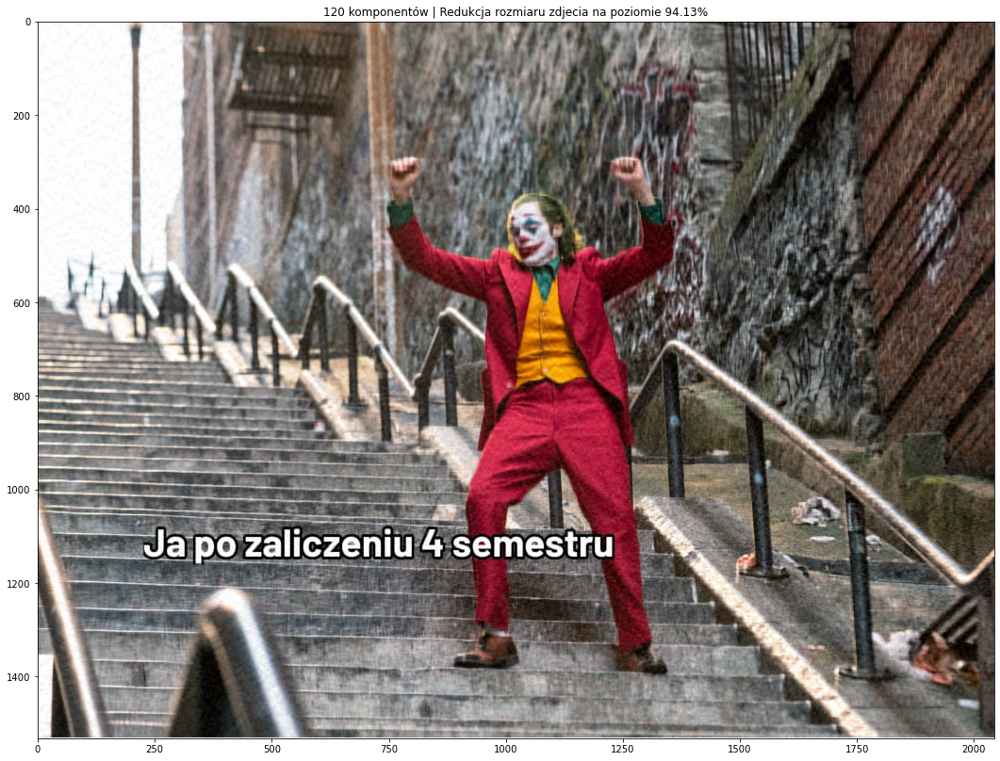

In [9]:
test_components_nr(img,120)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


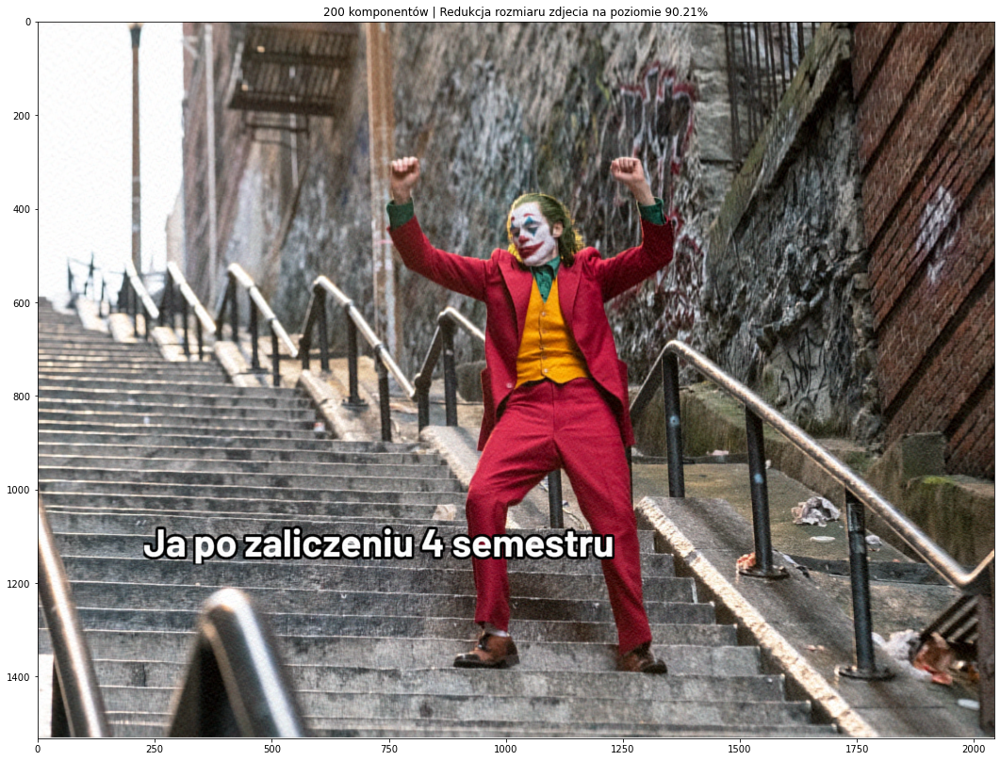

In [10]:
test_components_nr(img,200)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


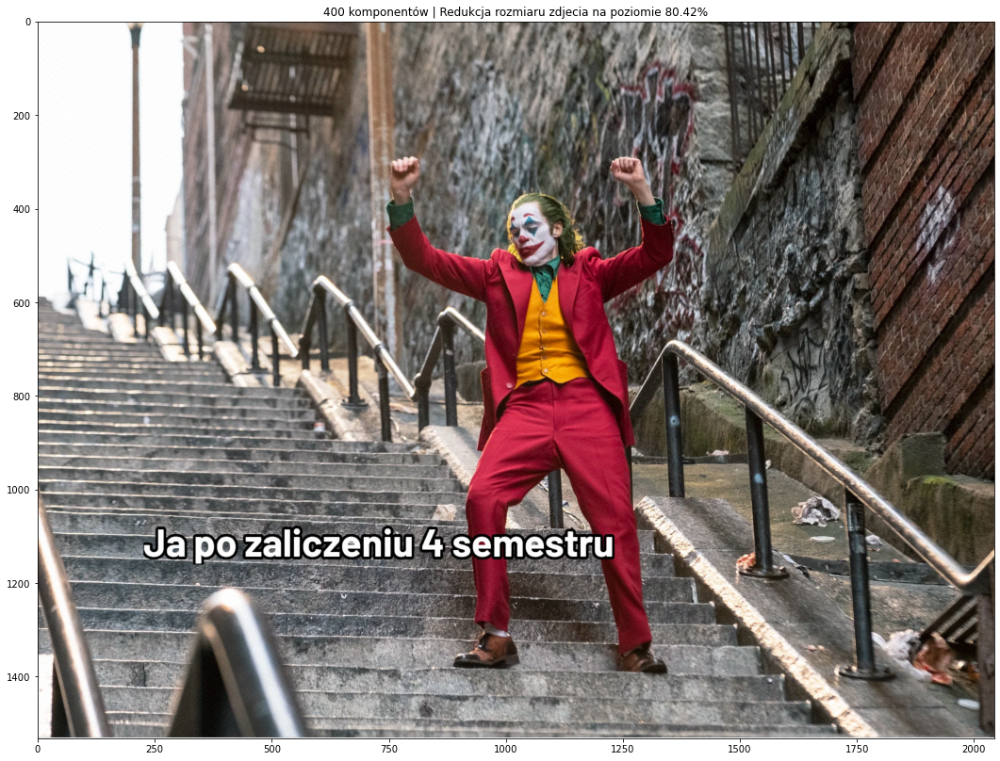

In [24]:
test_components_nr(img,400)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


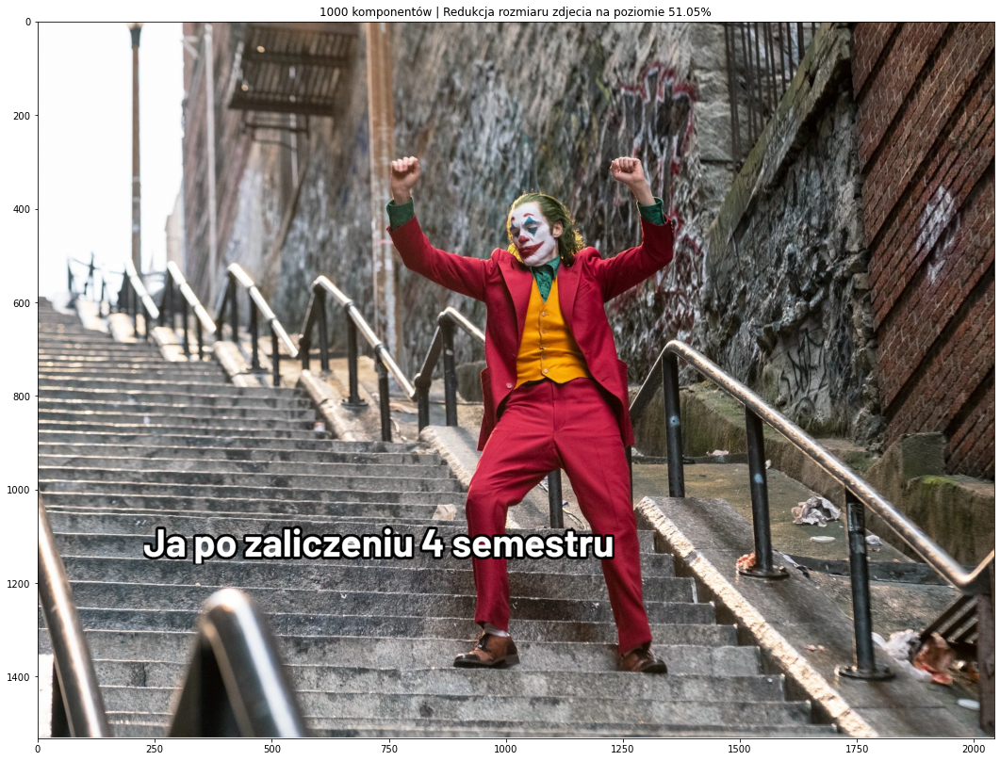

In [12]:
test_components_nr(img,1000)

## **Podsumowanie**

* PCA świetnie nadaje się do kompresji rozmiaru obrazu
* daje kontrolę nad jakością danego obrazu 
* możliwe jest znaczące zmniejszenie rozmiaru zdjęcia nie tracąc wiele na jego jakości
* każe zdjęcie będzie maiło swoje progi ilości cech, potrzebych do skutecznego odtworzenia zdjęcia